## Import & Data Loading

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import Imputer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from google.colab import drive
drive.mount('/content/drive')
data_dir = '/content/drive/My Drive/MIE368_Project/Data'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
listings_raw = pd.read_csv("{}/O_listings.csv".format(data_dir))
houseprice_raw = pd.read_csv("{}/properties.csv".format(data_dir))
distance_to_downtown = pd.read_csv("{}/distance_to_dt.csv".format(data_dir), header=None)
num_airbnb_nearby = pd.read_csv("{}/num_airbnb_nearby.csv".format(data_dir), header=None)
tone = pd.read_csv("{}/final_tone.csv".format(data_dir), header=None)
avg = pd.read_csv("{}/aveprice.csv".format(data_dir), header=None)
listings_raw = listings_raw.drop(columns=['room_type','id','listing_url','scrape_id','last_scraped','summary','space','experiences_offered','neighborhood_overview','notes','access','interaction','thumbnail_url','medium_url','picture_url','xl_picture_url','host_id','host_url','host_name','host_since','host_response_rate','host_acceptance_rate','host_thumbnail_url','host_picture_url','host_neighbourhood','host_listings_count','host_has_profile_pic','host_identity_verified','street','neighbourhood','neighbourhood_group_cleansed','city','state','zipcode','market','smart_location','country_code','country','is_location_exact','accommodates','beds','bed_type','square_feet','minimum_nights','maximum_nights','minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','calendar_updated','has_availability','availability_30','availability_60','availability_90','availability_365','calendar_last_scraped','number_of_reviews','number_of_reviews_ltm','first_review','last_review','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','requires_license','license','jurisdiction_names','is_business_travel_ready','calculated_host_listings_count','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms','reviews_per_month','host_location','host_verifications','neighbourhood_cleansed'])

houseprice = houseprice_raw.copy()

In [ ]:
tone = tone[1]
avg = avg[1]

In [ ]:
distance_to_downtown.head()
listings_raw['distance_to_downtown'] = distance_to_downtown
listings_raw['num_airbnb_nearby'] = num_airbnb_nearby
listings_raw['tones'] = tone
listings_raw['avgpropertyprice'] = avg
# d = pd.DataFrame(distance_Dt, columns = ['distance_Dt'])
# d.head()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f3db569fba8>,
      dtype=object)

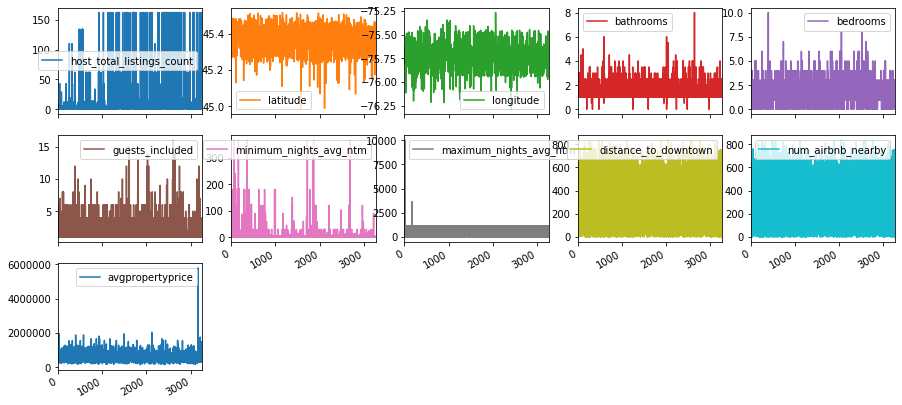

In [ ]:

listings_raw.plot(subplots=True, layout=(4,5), figsize=(15,10))

## Data Cleaning, Processing (Casting, One-hot-encoding, etc.)

In [ ]:
df_dropPriceNa = listings_raw.loc[listings_raw['price']!= 'NaN']
y_price = df_dropPriceNa.price
for i in range(0,3268):
  y_price[i] = y_price[i].replace('$','')
  y_price[i] = y_price[i].replace(',','')
y_price = y_price.astype(float)
listings_raw.drop(columns='price')
listings_raw['price'] = y_price
listings_raw.price
listings_raw = listings_raw.drop(listings_raw[listings_raw['price'] >= 557].index)
y_price = listings_raw.price
X = listings_raw.drop(columns=['price','weekly_price','monthly_price','security_deposit','cleaning_fee'])
X.reset_index(drop=True, inplace=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [ ]:
X['host_is_superhost'] = X['host_is_superhost'].replace('t',1)
X['host_is_superhost'] = X['host_is_superhost'].replace('f',0)
X['instant_bookable'] = X['instant_bookable'].replace('t',1)
X['instant_bookable'] = X['instant_bookable'].replace('f',0)
X['require_guest_profile_picture'] = X['require_guest_profile_picture'].replace('t',1)
X['require_guest_profile_picture'] = X['require_guest_profile_picture'].replace('f',0)
X['require_guest_phone_verification'] = X['require_guest_phone_verification'].replace('t',1)
X['require_guest_phone_verification'] = X['require_guest_phone_verification'].replace('f',0)


# df_room = X['room_type'] 
# df_room = pd.get_dummies(df_room)
# df_room = df_room.astype(int)
# X = pd.concat([df_room, X.drop(columns=['room_type'])], axis = 1)



amenities = pd.Series(data = X['amenities'])
amenities_strings	= ["Wifi", "Air conditioning","Kitchen","Free parking on premises","Heating","Family/kid friendly","Washer","Dryer","Smoke detector","Carbon monoxide detector","Fire extinguisher","Shampoo","Hot water","Bed linens","Extra pillows and blankets","Microwave","Coffee maker","Refrigerator","Dishes and silverware","Cooking basics","Oven,Stove","Long term stays allowed"]
X = X.drop(columns=['amenities'])
for word in amenities_strings:
  df_temp = amenities.str.contains( word, regex=False)
  df_temp = pd.DataFrame(data=df_temp)
  df_temp.columns = [word]
  #bool to 0/1
  df_temp = df_temp.astype(int)
  #merging 
  X = pd.concat([df_temp, X], axis = 1)
#去掉column名字里的空格  
X.columns = X.columns.str.replace(' ', '')


cancel = pd.Series(data = X['cancellation_policy'])
cancel_strings	= ["flexible", "moderate","strict_14_with_grace_period","super_strict_30"]
X = X.drop(columns=['cancellation_policy'])
for word in cancel_strings:
  df_temp = cancel.str.contains( word, regex=False)
  df_temp = pd.DataFrame(data=df_temp)
  df_temp.columns = [word]
  #bool to 0/1
  df_temp = df_temp.astype(int)
  #merging 
  X = pd.concat([df_temp, X], axis = 1)


X['host_response_time'] = X['host_response_time'].replace(np.nan,"response_none")
response = pd.Series(data = X['host_response_time'])
response_strings	= ["a few days or more", "within a day","within a few hours","within an hour","response_none"]
X = X.drop(columns=['host_response_time'])
for word in response_strings:
  df_temp = response.str.contains( word, regex=False)
  df_temp = pd.DataFrame(data=df_temp)
  df_temp.columns = [word]
  #bool to 0/1
  df_temp = df_temp.astype(int)
  #merging 
  X = pd.concat([df_temp, X], axis = 1)
#去掉column名字里的空格  
X.columns = X.columns.str.replace(' ', '')

X['name'] = X['name'].astype(str)
list = []
for i in range(0,3235):
  list.append(len(X.name[i].split()))
df_length = pd.DataFrame(list)
#count the words in the description and add to X
X['length_name'] = df_length

X = X.drop(columns=['name'])

X['description'] = X['description'].astype(str)
list = []
for i in range(0,3235):
  list.append(len(X.description[i].split()))
df_length = pd.DataFrame(list)
#count the words in the description and add to X
X['length_des'] = df_length

X = X.drop(columns=['description'])


X['host_about'] = X['host_about'].astype(str)
list = []
for i in range(0,3235):
  list.append(len(X.host_about[i].split()))
df_length = pd.DataFrame(list)
#count the words in the description and add to X
X['length_host'] = df_length

X = X.drop(columns=['host_about'])


for i in range(0,3235 ):
  X['extra_people'][i] = X['extra_people'][i].replace('$','')


X["extra_people"] = X["extra_people"].astype(float)

X['transit'] = X['transit'].replace(np.nan,"transit_none")
bus = []
for i in range(0,3235 ):
  if ("bus" in X['transit'][i].lower()):
    bus.append(1)
  else:
    bus.append(0)

walk = []
for i in range(0,3235 ):
  if ("walk" in X['transit'][i].lower()):
    walk.append(1)
  else:
    walk.append(0)

bik = []
for i in range(0,3235 ):
  if ("bik" in X['transit'][i].lower()):
    bik.append(1)
  else:
    bik.append(0)

train = []
for i in range(0,3235 ):
  if ("train" in X['transit'][i].lower()):
    train.append(1)
  else:
    train.append(0)

car = []
for i in range(0,3235 ):
  if ("car" in X['transit'][i].lower()):
    car.append(1)
  else:
    car.append(0)

airport = []
for i in range(0,3235 ):
  if ("airport" in X['transit'][i].lower()):
    airport.append(1)
  else:
    airport.append(0)

X["bus"] = pd.DataFrame(bus)
X["walk"] = pd.DataFrame(walk)
X["bik"] = pd.DataFrame(bik)
X["train"] = pd.DataFrame(train)
X["car"] = pd.DataFrame(car)
X["airport"] = pd.DataFrame(airport)
X = X.drop(columns=["transit"])

X['house_rules'] = X['house_rules'].replace(np.nan,"rule_none")

no_smoking = []
for i in range(0,3235 ):
  if ("no smoking" in X['house_rules'][i].lower() or "no smoke" in X['house_rules'][i].lower() or "smoke-free" in X['house_rules'][i].lower() or "or smoking" in X['house_rules'][i].lower()):
    no_smoking.append(1)
  else:
    no_smoking.append(0)

no_pet = []
for i in range(0,3235 ):
  if ("no pet" in X['house_rules'][i].lower()):
    no_pet.append(1)
  else:
    no_pet.append(0)

no_noise = []
for i in range(0,3235 ):
  if ("quiet" in X['house_rules'][i].lower() or "no noise" in X['house_rules'][i].lower() or "no loud noise" in X['house_rules'][i].lower()):
    no_noise.append(1)
  else:
    no_noise.append(0)

no_parties = []
for i in range(0,3235 ):
  if ("no parties" in X['house_rules'][i].lower()):
    no_parties.append(1)
  else:
    no_parties.append(0)

no_drug = []
for i in range(0,3235 ):
  if ("no drug" in X['house_rules'][i].lower() or "no drugs" in X['house_rules'][i].lower() or "drug free" in X['house_rules'][i].lower() or "or drug" in X['house_rules'][i].lower()):
    no_drug.append(1)
  else:
    no_drug.append(0)

no_alcohol = []
for i in range(0,3235 ):
  if ("no alcohol" in X['house_rules'][i].lower() or "alcohol free" in X['house_rules'][i].lower() or "or alcohol" in X['house_rules'][i].lower() or "no drinking alcohol" in X['house_rules'][i].lower()):
    no_alcohol.append(1)
  else:
    no_alcohol.append(0)


X["no_smoking"] = pd.DataFrame(no_smoking)
X["no_pet"] = pd.DataFrame(no_pet)
X["no_noise"] = pd.DataFrame(no_noise)
X["no_parties"] = pd.DataFrame(no_parties)
X["no_drug"] = pd.DataFrame(no_drug)
X["no_alcohol"] = pd.DataFrame(no_alcohol)
X = X.drop(columns=["house_rules"])

X['property_type'] = X['property_type'].astype(str)
list = []
for i in range(0,3235):
  if ((X.property_type[i] == "Aparthotel") or (X.property_type[i] == "Apartment") or (X.property_type[i] == "Boutique hotel") or (X.property_type[i] == "Condominium") or (X.property_type[i] == "Guest suite") or (X.property_type[i] == "Guesthouse") or (X.property_type[i] == "Hostel") or (X.property_type[i] == "Serviced apartment")):
    list.append("Apartment")
  elif ((X.property_type[i] == "House") or (X.property_type[i] == "Bungalow") or (X.property_type[i] == "Villa") or (X.property_type[i] == "Townhouse")):
    list.append("House")
  elif ((X.property_type[i] == "Camper/RV") or (X.property_type[i] == "Tent") or (X.property_type[i] == "Yurt") or (X.property_type[i] == "Boat")):
    list.append("Wild")
  elif ((X.property_type[i] == "Cabin") or (X.property_type[i] == "Chalet") or (X.property_type[i] == "Cottage") or (X.property_type[i] == "Farm stay") or (X.property_type[i] == "Loft")):
    list.append("Vacation")
  elif (X.property_type[i] == "Treehouse") :
    list.append("Nature")
  elif (X.property_type[i] == "Earth house"):
    list.append("Nature")
  else:
    list.append("Property_type_others")
df_newp = pd.DataFrame(list)
#count the words in the description and add to X
X['property_type'] = df_newp


df_prop = X['property_type'] 
df_prop = pd.get_dummies(df_prop)
# df_room.columns = ['Entire','Private_room','Shared_room']
#convert to int 
df_prop = df_prop.astype(int)
df_prop
X = pd.concat([df_prop, X.drop(columns=['property_type'])], axis = 1)

df_tones = X['tones'] 
df_tones = pd.get_dummies(df_tones)
# df_room.columns = ['Entire','Private_room','Shared_room']
#convert to int 
df_tones = df_tones.astype(int)
df_tones
X = pd.concat([df_tones, X.drop(columns=['tones'])], axis = 1)

median_per_column = X.apply(lambda x: x.median(), axis=0)
X_median_filled = X.fillna(median_per_column, axis=0)

In [ ]:
X.to_csv("{}/X_aftercleaning.csv".format(data_dir))

# **Model 0 - Baseline: Normalization, Linear Regression**

## y-variable transformation & x-variables normolization 
## plotted the correlation heatmap and dropped variables with large correlation 

In [ ]:
# We also save the model results
all_models = {}

In [ ]:
#check the value of y
count = y_price.value_counts()
#plt.hist(y_price)

In [ ]:
#found that the lowest value <10000, hence use sqrt
y_price_new = y_price.copy()
y_price_new = np.sqrt(y_price_new)
#plt.hist(y_price_new)

In [ ]:
from sklearn.preprocessing import StandardScaler
def normalize(X_train, X_val, non_binary_columns):
   # Define scaling function
    scaler = StandardScaler()
  
    # Scale the X features      
    X_train[non_binary_columns] = scaler.fit_transform(X_train[non_binary_columns])
    X_val[non_binary_columns] = scaler.transform(X_val[non_binary_columns])
                        
    return X_train, X_val, scaler

In [ ]:
#added distance_to_dt
non_binary_columns = ["avgpropertyprice","latitude","longitude","bathrooms","bedrooms","guests_included","extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host","distance_to_downtown","num_airbnb_nearby"]
df = pd.concat([y_price_new, X_median_filled], axis = 1)

,price,Agreeableness,Analytical,Anger,Confident,Conscientiousness,Disgust,Emotional Range,Extraversion,Joy,Openness,Sadness,Tentative,Apartment,House,Nature,Property_type_others,Vacation,Wild,response_none,withinanhour,withinafewhours,withinaday,afewdaysormore,super_strict_30,strict_14_with_grace_period,moderate,flexible,Longtermstaysallowed,"Oven,Stove",Cookingbasics,Dishesandsilverware,Refrigerator,Coffeemaker,Microwave,Extrapillowsandblankets,Bedlinens,Hotwater,Shampoo,Fireextinguisher,Carbonmonoxidedetector,Smokedetector,Dryer,Washer,Family/kidfriendly,Heating,Freeparkingonpremises,Kitchen,Airconditioning,Wifi,host_is_superhost,host_total_listings_count,latitude,longitude,bathrooms,bedrooms,guests_included,extra_people,minimum_nights_avg_ntm,maximum_nights_avg_ntm,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,distance_to_downtown,num_airbnb_nearby,avgpropertyprice,length_name,length_des,length_host,bus,walk,bik,train,car,airport,no_smoking,no_pet,no_noise,no_parties,no_drug,no_alcohol
price,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Agreeableness,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Analytical,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Anger,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Confident,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Conscientiousness,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Disgust,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Emotional Range,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Extraversion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

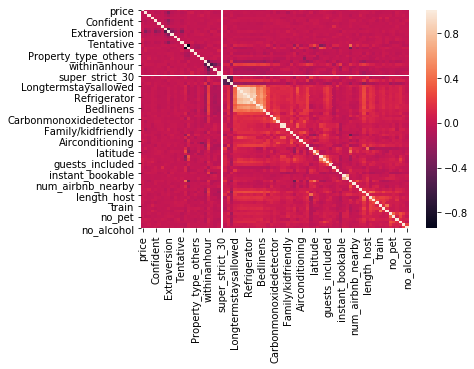

In [ ]:
sns.heatmap(df.corr())
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
df.corr()[df.corr().abs() > 0.8]

#hence we need to delete Oven,Stove + Dishesandsilverware + Refrigerator + Washer

In [ ]:
X_deleted = X_median_filled.drop(columns = ["Oven,Stove","Dishesandsilverware","Refrigerator","Washer"])

In [ ]:
y_price_new.reset_index(drop=True, inplace = True)

In [ ]:
X_deleted.reset_index(drop=True, inplace = True)

In [ ]:
df = pd.concat([y_price_new, X_deleted], axis = 1)

In [ ]:
X_deleted.shape

(3235, 76)

In [ ]:
y_price_new.shape

(3235,)

In [ ]:
df

,price,Agreeableness,Analytical,Anger,Confident,Conscientiousness,Disgust,Emotional Range,Extraversion,Joy,Openness,Sadness,Tentative,Apartment,House,Nature,Property_type_others,Vacation,Wild,response_none,withinanhour,withinafewhours,withinaday,afewdaysormore,super_strict_30,strict_14_with_grace_period,moderate,flexible,Longtermstaysallowed,Cookingbasics,Coffeemaker,Microwave,Extrapillowsandblankets,Bedlinens,Hotwater,Shampoo,Fireextinguisher,Carbonmonoxidedetector,Smokedetector,Dryer,Family/kidfriendly,Heating,Freeparkingonpremises,Kitchen,Airconditioning,Wifi,host_is_superhost,host_total_listings_count,latitude,longitude,bathrooms,bedrooms,guests_included,extra_people,minimum_nights_avg_ntm,maximum_nights_avg_ntm,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,distance_to_downtown,num_airbnb_nearby,avgpropertyprice,length_name,length_des,length_host,bus,walk,bik,train,car,airport,no_smoking,no_pet,no_noise,no_parties,no_drug,no_alcohol
0,14.177447,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,1,45.40924,-75.67900,1.0,1.0,2,20.0,7.0,31.0,0,0,0,420,0,4.749667e+05,2,176,1,0,0,0,0,0,0,1,0,0,0,0,0
1,8.062258,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,1,1,1,0,1,1,1,0,1,1,1,1,1,0,1,45.40159,-75.74679,2.0,1.0,1,10.0,1.0,31.0,0,0,0,98,420,9.839500e+05,5,172,43,0,0,0,0,0,0,0,0,0,0,0,0
2,14.142136,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,45.35900,-75.80314,1.0,1.0,1,20.0,3.0,730.0,0,0,0,61,98,1.354130e+06,7,164,2,0,0,0,0,0,0,0,0,0,0,0,0
3,8.366600,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,0,1,0,0,45.36371,-75.79686,1.0,1.0,2,15.0,28.0,730.0,0,0,0,63,61,4.406167e+05,6,182,77,1,1,0,0,0,0,1,0,0,0,0,0
4,11.832160,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,2,45.40248,-75.69941,1.0,2.0,1,0.0,3.0,365.0,0,0,0,479,63,6.488000e+05,4,168,40,0,0,0,0,0,0,0,0,0,0,0,0
5,8.888194,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,45.36258,-75.74596,1.5,1.0,1,53.0,1.0,730.0,0,1,1,61,479,5.349500e+05,3,129,6,0,0,0,0,0,0,0,0,0,0,0,0
6,12.247449,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0,0,0,1,0,1,1,1,0,1,1,1,1,1,1,1,45.38972,-75.75496,1.0,1.0,2,25.0,2.0,180.0,0,0,1,69,61,6.866333e+05,4,164,187,1,1,0,0,1,1,1,1,0,0,0,0
7,7.416198,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,1,0,1,1,1,1,1,1,1,45.40686,-75.70237,1.0,1.0,1,10.0,1.0,15.0,1,0,0,551,69,9.912833e+05,5,169,73,0,0,0,0,0,0,0,0,0,0,0,0
8,8.062258,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,1,1,1,0,2,45.41557,-75.70551,1.0,1.0,1,40.0,1.0,300.0,0,0,0,466,551,2.862833e+05,9,167,38,1,0,1,0,0,0,0,0,0,0,0,0
9,7.810250,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,0,1,0,1,1,1,45.40642,-75.69180,1.0,1.0,1,20.0,1.0,30.0,0,1,1,599,466,6.641313e+05,8,173,142,1,1,0,0,0,1,0,1,0,0,1,1


### Linear Regression Model with normalized data has a R^2 score of: 

The train score is 0.49409851862389614 and the test score is 0.4608898835053176

In [ ]:
#split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.head(2500).drop('price',1), df['price'].head(2500), test_size=0.30, random_state=5)

In [ ]:
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
X_train_scaled, X_val_scaled, scaler = normalize(X_train, X_test, non_binary_columns)

linreg = LinearRegression()
linreg.fit(X_train_scaled, y_train)

train_score = linreg.score(X_train_scaled, y_train)
test_score = linreg.score(X_val_scaled, y_test)

print('The train score is {} and the test score is {}'.format(train_score, test_score))

betas = pd.Series(linreg.coef_, index=X_train_scaled.columns)
betas = betas.append(pd.Series({"Intercept": linreg.intercept_}))
print(betas)

all_models['only_normalize'] = (train_score, test_score, linreg, 'run normalize()')

The train score is 0.49409851862389614 and the test score is 0.4608898835053176
Agreeableness                      -1.515436e+00
Analytical                         -1.550308e+00
Anger                              -3.774758e-15
Confident                          -1.676289e+00
Conscientiousness                  -1.057457e+00
Disgust                            -2.442491e-15
Emotional Range                    -1.901097e+00
Extraversion                       -1.897433e+00
Joy                                -1.788088e+00
Openness                           -1.640525e+00
Sadness                            -1.950085e+00
Tentative                          -1.756886e+00
Apartment                           3.441247e-01
House                              -9.008671e-01
Nature                             -4.218847e-15
Property_type_others                2.055365e-01
Vacation                            1.159422e+00
Wild                               -8.082157e-01
response_none                       7.

# **Model 1: using monotone and linear regression**

### Linear Regression Model with monotone transfored data has a R^2 score of: 

The train score is 0.5244813829899054 and the test score is 0.41948378530898606


In [ ]:
def monotone_transform(X):
    X_new = X.copy()
    X_new['SQRTextra_people'] = np.sqrt(X_new['extra_people'])
    X_new['SQRTminimum_nights_avg_ntm'] = np.sqrt(X_new['minimum_nights_avg_ntm']+1)
    X_new['SQRTmaximum_nights_avg_ntm'] = np.sqrt(X_new['maximum_nights_avg_ntm'])
    X_new['SQRTlength_name'] = np.sqrt(X_new['length_name'])
    X_new['SQRTlength_des'] = np.sqrt(X_new['length_des'])
    X_new['SQRTlength_host'] = np.sqrt(X_new['length_host'])
    X_new['SQRTdistance_to_downtown'] = np.sqrt(X_new['distance_to_downtown'])
    X_new['SQRTnum_airbnb_nearby'] = np.sqrt(X_new['num_airbnb_nearby'])
    X_new['SQRTavgp'] = np.sqrt(X_new['avgpropertyprice'])
    
    return X_new

In [ ]:
X_new = monotone_transform(X_deleted)

In [ ]:
df = pd.concat([y_price_new, X_new], axis = 1)

In [ ]:
#split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)

In [ ]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)

train_score = linreg.score(X_train, y_train)
test_score = linreg.score(X_test, y_test)

print('The train score is {} and the test score is {}'.format(train_score, test_score))

betas = pd.Series(linreg.coef_, index=X_train.columns)
betas = betas.append(pd.Series({"Intercept": linreg.intercept_}))
print(betas)

all_models['monotone'] = (train_score, test_score, linreg, 'run monotone_transform()')

The train score is 0.5244813829899054 and the test score is 0.41948378530898606
Agreeableness                      -5.885379e-01
Analytical                          3.251699e-01
Anger                               7.226119e-01
Confident                          -7.135342e-01
Conscientiousness                   2.321572e-01
Disgust                            -6.810871e-14
Emotional Range                    -6.011468e-01
Extraversion                       -4.284811e-01
Joy                                -3.288263e-01
Openness                           -1.903546e-01
Sadness                            -6.784774e-01
Tentative                          -3.127282e-01
Apartment                          -1.105817e+00
House                              -2.433467e+00
Nature                              3.359261e+00
Property_type_others               -1.079657e+00
Vacation                           -5.872742e-01
Wild                                1.846955e+00
response_none                       5.

# **Model 2: Monotone transform, New features with linear regression**
## Looking for new features by combining (/&**) two or more features and see if the absolute correlation has significant improvement 
## The Linear Regression model with monotone transformed data and new feature has a R^2 score of: 

The train score is 0.5368347743985875 and the test score is 0.4225059669570755

In [ ]:
# find interaction effects from combining two or more features
base_corrs = df.corr().price.drop(index='price')

for feature1 in base_corrs.index:
    for feature2 in base_corrs.index:
        if feature2 != feature1:
            # divide the two features to create a new feature
            new_feature = X_train[feature1] / X_train[feature2]
            new_corr = np.abs(np.round(np.corrcoef(new_feature, y_train)[0,1], 3))
            corr1 = np.abs(np.round(base_corrs[feature1], 3))
            corr2 = np.abs(np.round(base_corrs[feature2], 3))
            # add a threshold of 0.05 to make sure that the improvement is meaningful
            if new_corr > max(corr1, corr2)+0.05:
                print('{} {} combine to get correlation {} compared to {} {}'.format(
                    feature1, feature2, np.round(np.corrcoef(new_feature, y_train)[0,1], 3), corr1, corr2))

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Emotional Range minimum_nights_avg_ntm combine to get correlation -0.083 compared to 0.019 0.011
Extraversion minimum_nights_avg_ntm combine to get correlation -0.078 compared to 0.008 0.011
House minimum_nights_avg_ntm combine to get correlation -0.228 compared to 0.141 0.011


/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2449: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


withinanhour minimum_nights_avg_ntm combine to get correlation -0.14 compared to 0.053 0.011
Hotwater minimum_nights_avg_ntm combine to get correlation -0.136 compared to 0.056 0.011
Carbonmonoxidedetector minimum_nights_avg_ntm combine to get correlation -0.149 compared to 0.007 0.011
Smokedetector minimum_nights_avg_ntm combine to get correlation -0.17 compared to 0.028 0.011
Heating minimum_nights_avg_ntm combine to get correlation -0.164 compared to 0.021 0.011
Wifi minimum_nights_avg_ntm combine to get correlation -0.187 compared to 0.02 0.011
Wifi SQRTminimum_nights_avg_ntm combine to get correlation -0.112 compared to 0.02 0.036
latitude minimum_nights_avg_ntm combine to get correlation -0.193 compared to 0.061 0.011
latitude SQRTminimum_nights_avg_ntm combine to get correlation -0.122 compared to 0.061 0.036
longitude minimum_nights_avg_ntm combine to get correlation 0.193 compared to 0.06 0.011
longitude SQRTminimum_nights_avg_ntm combine to get correlation 0.122 compared to 0

In [ ]:
for feature1 in base_corrs.index:
    for feature2 in base_corrs.index:
        if feature2 != feature1:
            # two features to the power to create a new feature
            new_feature = X_train[feature1] ** X_train[feature2]
            new_corr = np.abs(np.round(np.corrcoef(new_feature, y_train)[0,1], 3))
            corr1 = np.abs(np.round(base_corrs[feature1], 3))
            corr2 = np.abs(np.round(base_corrs[feature2], 3))
            # add a threshold of 0.05 to make sure that the improvement is meaningful
            if new_corr > max(corr1, corr2)+0.05:
                print('{} {} combine to get correlation {} compared to {} {}'.format(
                    feature1, feature2, np.round(np.corrcoef(new_feature, y_train)[0,1], 3), corr1, corr2))

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2449: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Agreeableness extra_people combine to get correlation 0.093 compared to 0.004 0.029
Analytical extra_people combine to get correlation 0.103 compared to 0.004 0.029
Analytical SQRTextra_people combine to get correlation 0.103 compared to 0.004 0.044
Anger extra_people combine to get correlation 0.1 compared to 0.019 0.029
Anger SQRTextra_people combine to get correlation 0.1 compared to 0.019 0.044
Confident extra_people combine to get correlation 0.09 compared to 0.004 0.029
Conscientiousness extra_people combine to get correlation 0.101 compared to 0.012 0.029
Conscientiousness SQRTextra_people combine to get correlation 0.101 compared to 0.012 0.044
Disgust extra_people combine to get correlation 0.1 compared to 0.002 0.029
Disgust SQRTextra_people combine to get correlation 0.1 compared to 0.002 0.044
Joy extra_people combine to get correlation 0.109 compared to 0.017 0.029
Joy SQRTextra_people combine to get correlation 0.109 compared to 0.017 0.044
Openness extra_people combine t

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:151: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)


bathrooms Shampoo combine to get correlation 0.36 compared to 0.306 0.157
bathrooms Freeparkingonpremises combine to get correlation 0.366 compared to 0.306 0.15
extra_people Extrapillowsandblankets combine to get correlation 0.082 compared to 0.029 0.03
extra_people SQRTlength_name combine to get correlation 0.095 compared to 0.029 0.005
minimum_nights_avg_ntm longitude combine to get correlation -0.247 compared to 0.011 0.06
require_guest_profile_picture extra_people combine to get correlation 0.097 compared to 0.015 0.029
require_guest_profile_picture SQRTextra_people combine to get correlation 0.097 compared to 0.015 0.044
require_guest_phone_verification extra_people combine to get correlation 0.098 compared to 0.015 0.029
require_guest_phone_verification SQRTextra_people combine to get correlation 0.098 compared to 0.015 0.044
distance_to_downtown Shampoo combine to get correlation 0.222 compared to 0.141 0.157
distance_to_downtown Freeparkingonpremises combine to get correlation

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: divide by zero encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: divide by zero encountered in true_divide
  c /= stddev[None, :]


In [ ]:
def new_feature_combos(X):
   
    # First, we apply the monotone transform function
    X_new = monotone_transform(X)
    
    # Then we add new features
    X_new['minimum_nights_avg_ntm_/_maximum_nights_avg_ntm'] = X_new.minimum_nights_avg_ntm/X_new.maximum_nights_avg_ntm #has positive correlation with price
    # X_new['extra_people_/_minimum_nights_avg_ntm'] = X_new.extra_people/X_new.minimum_nights_avg_ntm #has negative correlation with price
    X_new['Cookingbasics_**_Microwave'] = X_new.Cookingbasics ** X_new.Microwave #has positive correlation with price
    X_new['Cookingbasics_**_Hotwater'] = X_new.Cookingbasics ** X_new.Hotwater #has positive correlation with price
    X_new['Coffeemaker_**_Microwave'] = X_new.Coffeemaker ** X_new.Microwave #has positive correlation with price
    X_new['Coffeemaker_**_Hotwater'] = X_new.Coffeemaker ** X_new.Hotwater #has positive correlation with price
    X_new['Extrapillowsandblankets_**_extra_people'] = X_new.Extrapillowsandblankets ** X_new.extra_people #has positive correlation with price
    X_new['Shampoo_**_Hotwater'] = X_new.Shampoo ** X_new.Hotwater #has positive correlation with price
    X_new['Freeparkingonpremises_**_House'] = X_new.Freeparkingonpremises ** X_new.House #has positive correlation with price, it makes sense!!
    X_new['num_airbnb_nearby_**_Freeparkingonpremises'] = X_new.num_airbnb_nearby ** X_new.Freeparkingonpremises #has positive correlation with price
    X_new['num_airbnb_nearby_**_Airconditioning'] = X_new.num_airbnb_nearby ** X_new.Airconditioning #has positive correlation with price

    return X_new

In [ ]:
X_new = new_feature_combos(X_deleted)

df = pd.concat([y_price_new, X_new], axis = 1)

#split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)

In [ ]:
df.to_csv("{}/X_afterfeatureeng.csv".format(data_dir))

In [ ]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)

train_score = linreg.score(X_train, y_train)
test_score = linreg.score(X_test, y_test)

print('The train score is {} and the test score is {}'.format(train_score, test_score))

betas = pd.Series(linreg.coef_, index=X_train.columns)
betas = betas.append(pd.Series({"Intercept": linreg.intercept_}))
print(betas)

all_models['new_feature_combos'] = (train_score, test_score, linreg, 'run new_feature_combos()')

The train score is 0.5368347743985875 and the test score is 0.4225059669570755
Agreeableness                                     -5.976441e-01
Analytical                                         3.040480e-01
Anger                                              5.533420e-01
Confident                                         -7.693561e-01
Conscientiousness                                  1.347293e-01
Disgust                                           -3.027439e-14
Emotional Range                                   -6.079001e-01
Extraversion                                      -4.254047e-01
Joy                                               -3.696124e-01
Openness                                          -1.989455e-01
Sadness                                           -5.774399e-01
Tentative                                         -3.356498e-01
Apartment                                         -1.197878e+00
House                                             -2.219758e+00
Nature                   

### Histogram of real price and predicted price

5.1744

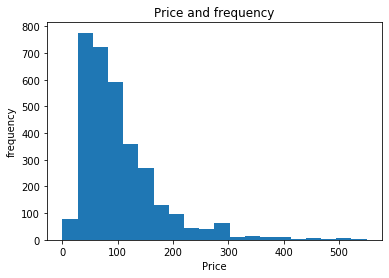

In [ ]:
import matplotlib.pyplot as plt
#y_test graph
plt.hist(y_price, bins = 20)
plt.title("Price and frequency")
plt.ylabel("frequency")
plt.xlabel("Price")

np.percentile(y_price,0.01)


4.020766286481502

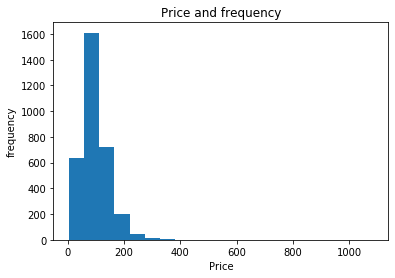

In [ ]:
plt.hist((linreg.predict(X_new))**2, bins = 20)
plt.title("Price and frequency")
plt.ylabel("frequency")
plt.xlabel("Price")


np.percentile(linreg.predict(X_new)**2,0.01)

# **Model 3: Linear Regression model using normalization, new features and monotone**

## The monotone transformed and normolized data with new feature has a R^2 score of: 

The train score is 0.5227466812486565 and the test score is 0.4578792085229717

In [ ]:
pd.set_option('display.max_columns',None)
X_new = new_feature_combos(X_deleted)


In [ ]:
from sklearn.preprocessing import StandardScaler

# Define the non-binary data columns (after new features)
non_binary_columns = ["latitude","longitude","bathrooms","bedrooms","guests_included","extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host","SQRTextra_people","SQRTminimum_nights_avg_ntm","SQRTmaximum_nights_avg_ntm","SQRTlength_name","SQRTlength_des","SQRTlength_host","minimum_nights_avg_ntm_/_maximum_nights_avg_ntm","distance_to_downtown","num_airbnb_nearby","SQRTdistance_to_downtown","SQRTnum_airbnb_nearby"]

X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)


#split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)


def new_features_and_normalize(X_train, X_test, non_binary_columns):
    # Function that normalizes the non binary data so that across all data 
    # points (i.e., rows) the mean and standard deviation of a features is 0 
    # and 1, respectively.
    
    # Make feature combos from original data
    X_train_scaled = new_feature_combos(X_train)
    X_test_scaled = new_feature_combos(X_test)
    
    # Define scaling function
    scaler = StandardScaler()

  
    # Scale the X features      
    X_train_scaled[non_binary_columns] = scaler.fit_transform(X_train_scaled[non_binary_columns])
    X_test_scaled[non_binary_columns] = scaler.transform(X_test_scaled[non_binary_columns])
                        
    return X_train_scaled, X_test_scaled, scaler

In [ ]:
X_train_scaled, X_test_scaled, scaler = new_features_and_normalize(X_train, X_test, non_binary_columns)

X_train_scaled = X_train_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])
X_test_scaled = X_test_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])


linreg = LinearRegression()
linreg.fit(X_train_scaled, y_train)

train_score = linreg.score(X_train_scaled, y_train)
test_score = linreg.score(X_test_scaled, y_test)

print('The train score is {} and the test score is {}'.format(train_score, test_score))

betas = pd.Series(linreg.coef_, index=X_train_scaled.columns)
betas = betas.append(pd.Series({"Intercept": linreg.intercept_}))
print(betas)

all_models['new_features_and_normalize'] = (train_score, test_score, linreg, 'run new_features_and_normalize()')

The train score is 0.5227466812486565 and the test score is 0.4578792085229717
Agreeableness                                     -5.920360e-01
Analytical                                         4.110618e-01
Anger                                              2.307426e-01
Confident                                         -8.252017e-01
Conscientiousness                                  1.229803e-01
Disgust                                            8.770762e-15
Emotional Range                                   -6.253542e-01
Extraversion                                      -4.293968e-01
Joy                                               -3.792232e-01
Openness                                          -3.255051e-01
Sadness                                           -5.931466e-01
Tentative                                         -3.250574e-01
Apartment                                         -1.240584e+00
House                                             -2.269645e+00
Nature                   

### New histogram with predicted price

3.7597919080309596

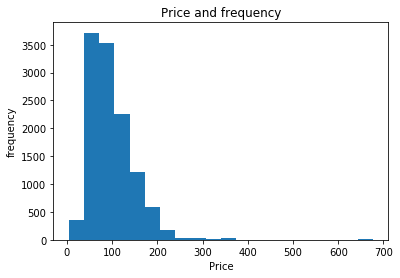

In [ ]:
# X_new = X_new.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])
X_train_scaled = X_train_scaled.append(X_test_scaled)
plt.hist((linreg.predict(X_train_scaled)**2), bins = 20)
plt.title("Price and frequency")
plt.ylabel("frequency")
plt.xlabel("Price")

np.percentile((linreg.predict(X_train_scaled)**2),0.01)

# **Model 4: LASSO with new feature**
## The R^2 score is: 
The train score is 0.020474917875268672 and the test score is 0.006160697659287839

In [ ]:
X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)

#split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)

#try Lasso
# Fit the model
lasso = LassoCV()
lasso.fit(X_train, y_train)

# calculate the score
train_score = lasso.score(X_train, y_train)
test_score = lasso.score(X_test, y_test)
print('The train score is {} and the test score is {}'.format(train_score, test_score))

# calculate betas
betas = pd.Series(lasso.coef_, index=X_train.columns)
betas = betas.append(pd.Series({"Intercept": lasso.intercept_}))
print(betas)


all_models['LASSO_new_features_and_normalize'] = (train_score, test_score, linreg, 'run LASSO new_features_and_normalize()')

The train score is 0.020474917875268672 and the test score is 0.006160697659287839
Agreeableness                                     -0.000000
Analytical                                         0.000000
Anger                                              0.000000
Confident                                         -0.000000
Conscientiousness                                  0.000000
Disgust                                            0.000000
Emotional Range                                   -0.000000
Extraversion                                       0.000000
Joy                                                0.000000
Openness                                          -0.000000
Sadness                                            0.000000
Tentative                                         -0.000000
Apartment                                          0.000000
House                                             -0.000000
Nature                                             0.000000
Property_type_oth

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


# **Model 5: using LASSO with new feature and normalization**

The train score is 0.010522488086574966 and the test score is -0.0017162227136751083

In [ ]:
X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)
non_binary_columns = ["latitude","longitude","bathrooms","bedrooms","guests_included","extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host","SQRTextra_people","SQRTminimum_nights_avg_ntm","SQRTmaximum_nights_avg_ntm","SQRTlength_name","SQRTlength_des","SQRTlength_host","minimum_nights_avg_ntm_/_maximum_nights_avg_ntm","distance_to_downtown","num_airbnb_nearby","SQRTdistance_to_downtown","SQRTnum_airbnb_nearby"]

#split train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)


X_train_scaled, X_test_scaled, scaler = new_features_and_normalize(X_train, X_test, non_binary_columns)

X_train_scaled = X_train_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])
X_test_scaled = X_test_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])


lasso = LassoCV()
lasso.fit(X_train_scaled, y_train)

# calculate the score
train_score = lasso.score(X_train_scaled, y_train)
test_score = lasso.score(X_test_scaled, y_test)
print('The train score is {} and the test score is {}'.format(train_score, test_score))

# calculate betas
betas = pd.Series(lasso.coef_, index=X_train_scaled.columns)
betas = betas.append(pd.Series({"Intercept": lasso.intercept_}))
print(betas)

all_models['LASSO_new_features'] = (train_score, test_score, linreg, 'run LASSO new_features()')

The train score is 0.010522488086574966 and the test score is -0.0017162227136751083
Agreeableness                                     -0.000000
Analytical                                         0.000000
Anger                                              0.000000
Confident                                         -0.000000
Conscientiousness                                  0.000000
Disgust                                            0.000000
Emotional Range                                   -0.000000
Extraversion                                       0.000000
Joy                                                0.000000
Openness                                          -0.000000
Sadness                                            0.000000
Tentative                                         -0.000000
Apartment                                          0.000000
House                                             -0.000000
Nature                                             0.000000
Property_type_o

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


# **Model 6:  RIDGE with new feature**

The train score is 0.5339372152042758 and the test score is 0.43772937143633517

In [ ]:
X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)


In [ ]:
X_train.shape

(2264, 95)

In [ ]:
X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)

#split train and test
from sklearn.model_selection import train_test_split

X_train1, X_test1, y_train1, y_test1 = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)


#try ridge
# Fit the model
ridge = RidgeCV()
ridge.fit(X_train1, y_train1)

# calculate the score
train_score = ridge.score(X_train1, y_train1)
test_score = ridge.score(X_test1, y_test1)
print('The train score is {} and the test score is {}'.format(train_score, test_score))

# calculate betas
betas = pd.Series(ridge.coef_, index=X_train.columns)
betas = betas.append(pd.Series({"Intercept": ridge.intercept_}))
print(betas)

all_models['RIDGE_new_features_and_normalize'] = (train_score, test_score, linreg, 'run RIDGE new_features_and_normalize()')

The train score is 0.5339372152042758 and the test score is 0.43772937143633517
Agreeableness                                      -0.228222
Analytical                                          0.466866
Anger                                               0.071905
Confident                                          -0.398020
Conscientiousness                                   0.366228
Disgust                                             0.000000
Emotional Range                                    -0.282810
Extraversion                                       -0.115133
Joy                                                -0.029549
Openness                                            0.076374
Sadness                                            -0.064199
Tentative                                          -0.027855
Apartment                                          -0.303048
House                                              -1.317950
Nature                                              0.333997
Prope

# **Model 7:  RIDGE with new feature and normalization**
The train score is 0.5204343576589647 and the test score is 0.4712047077207021

In [ ]:
X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)
non_binary_columns = ["latitude","longitude","bathrooms","bedrooms","guests_included","extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host","SQRTextra_people","SQRTminimum_nights_avg_ntm","SQRTmaximum_nights_avg_ntm","SQRTlength_name","SQRTlength_des","SQRTlength_host","minimum_nights_avg_ntm_/_maximum_nights_avg_ntm","distance_to_downtown","num_airbnb_nearby","SQRTdistance_to_downtown","SQRTnum_airbnb_nearby"]

#split train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)


X_train_scaled, X_test_scaled, scaler = new_features_and_normalize(X_train, X_test, non_binary_columns)

X_train_scaled = X_train_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])
X_test_scaled = X_test_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])


ridge = RidgeCV()
ridge.fit(X_train_scaled, y_train)

# calculate the score
train_score = ridge.score(X_train_scaled, y_train)
test_score = ridge.score(X_test_scaled, y_test)
print('The train score is {} and the test score is {}'.format(train_score, test_score))

# calculate betas
betas = pd.Series(ridge.coef_, index=X_train_scaled.columns)
betas = betas.append(pd.Series({"Intercept": ridge.intercept_}))
print(betas)

all_models['RIDGE_new_features'] = (train_score, test_score, linreg, 'run RIDGE new_features()')

The train score is 0.5204343576589647 and the test score is 0.4712047077207021
Agreeableness                                     -0.210684
Analytical                                         0.560420
Anger                                              0.045131
Confident                                         -0.437814
Conscientiousness                                  0.365725
Disgust                                            0.000000
Emotional Range                                   -0.291809
Extraversion                                      -0.108680
Joy                                               -0.036833
Openness                                           0.002359
Sadness                                           -0.052418
Tentative                                         -0.012865
Apartment                                         -0.260486
House                                             -1.286532
Nature                                             0.382025
Property_type_others 

# **Model 8: Random forest regressor with new feature**
The train score is 0.558582082460926 and the test score is 0.4927816602752103

In [ ]:
X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)

#split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)

from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(max_depth=4, random_state=0, n_estimators=100)
regr.fit(X_train, y_train)

# calculate the score
train_score = regr.score(X_train, y_train)
test_score = regr.score(X_test, y_test)
print('The train score is {} and the test score is {}'.format(train_score, test_score))

# calculate betas
betas = pd.Series(regr.feature_importances_, index=X_train.columns)
# betas = betas.append(pd.Series({"Intercept": regr.intercept_}))
print(betas)

all_models['random_forest_new_features'] = (train_score, test_score, linreg, 'run random_forest new_features()')

The train score is 0.558582082460926 and the test score is 0.4927816602752103
Agreeableness                                      2.626333e-04
Analytical                                         9.763910e-05
Anger                                              0.000000e+00
Confident                                          1.912180e-04
Conscientiousness                                  5.766749e-07
Disgust                                            0.000000e+00
Emotional Range                                    0.000000e+00
Extraversion                                       0.000000e+00
Joy                                                0.000000e+00
Openness                                           0.000000e+00
Sadness                                            0.000000e+00
Tentative                                          0.000000e+00
Apartment                                          0.000000e+00
House                                              1.508484e-01
Nature                    

# **Model 8: Random forest regressor with new feature and normalization**
The train score is 0.5584073181021428 and the test score is 0.49357716578543626

In [ ]:
from sklearn.ensemble import RandomForestRegressor

X_new = new_feature_combos(X_deleted)
df = pd.concat([y_price_new, X_new], axis = 1)
non_binary_columns = ["latitude","longitude","bathrooms","bedrooms","guests_included","extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host","SQRTextra_people","SQRTminimum_nights_avg_ntm","SQRTmaximum_nights_avg_ntm","SQRTlength_name","SQRTlength_des","SQRTlength_host","minimum_nights_avg_ntm_/_maximum_nights_avg_ntm","distance_to_downtown","num_airbnb_nearby","SQRTdistance_to_downtown","SQRTnum_airbnb_nearby"]

#split train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.drop('price',1), df['price'], test_size=0.30, random_state=5)


X_train_scaled, X_test_scaled, scaler = new_features_and_normalize(X_train, X_test, non_binary_columns)

X_train_scaled = X_train_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])
X_test_scaled = X_test_scaled.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])



regr = RandomForestRegressor(max_depth=4, random_state=0, n_estimators=100)
regr.fit(X_train_scaled, y_train)

# calculate the score
train_score = regr.score(X_train_scaled, y_train)
test_score = regr.score(X_test_scaled, y_test)
print('The train score is {} and the test score is {}'.format(train_score, test_score))

# calculate betas
betas = pd.Series(regr.feature_importances_, index=X_train_scaled.columns)
# betas = betas.append(pd.Series({"Intercept": regr.intercept_}))
print(betas)

all_models['random_forest_new_features_and_normalize'] = (train_score, test_score, linreg, 'run random_forest new_features_and_normalize()')


The train score is 0.5584073181021428 and the test score is 0.49357716578543626
Agreeableness                                      2.626333e-04
Analytical                                         9.763910e-05
Anger                                              0.000000e+00
Confident                                          0.000000e+00
Conscientiousness                                  0.000000e+00
Disgust                                            0.000000e+00
Emotional Range                                    1.534258e-06
Extraversion                                       1.234939e-04
Joy                                                0.000000e+00
Openness                                           0.000000e+00
Sadness                                            0.000000e+00
Tentative                                          0.000000e+00
Apartment                                          0.000000e+00
House                                              1.510390e-01
Nature                  

339.10059611383474

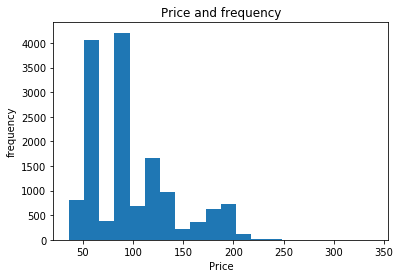

In [ ]:
# X_new = new_feature_combos(X_deleted)
# X_new = X_new.drop(columns = ["extra_people","minimum_nights_avg_ntm","maximum_nights_avg_ntm","length_name","length_des","length_host"])

X_train_scaled = X_train_scaled.append(X_test_scaled)


plt.hist((regr.predict(X_train_scaled))**2, bins = 20)
plt.title("Price and frequency")
plt.ylabel("frequency")
plt.xlabel("Price")

np.max((regr.predict(X_train_scaled))**2)